<a href="https://colab.research.google.com/github/TarfaGaida/Feature-Importance/blob/main/HW_EC9_featureImportnace_TarfaGaida.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install & Load Package

In [1]:
!pip install scipy==1.11.4
!pip install dalex
!pip install scikit-plot
!pip install shap
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 13.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.7.2-py3-none-any.whl size=1042899 sha256=4b5921cefe48202b0da3e77cbe2f25bad8b918ffa1138006f8b013124b07bfc7
  Stored in directory: /root/.cache/pip/wheels/cd/5e/ec/848120d5b913158656c0f8ef316233dd3356effa64aef19fba
Successfully built dalex
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=183af820fd56c6d765a3c748b36e8963b98fedede7baf8d941f7fc00e8f26f9b
  Stored in direc

In [2]:
# import pandas for data wrangling
import pandas as pd
# import numpy for vectorize data manipulation
import numpy as np
# import matplotlib.pyplot module for data visualization
import matplotlib.pyplot as plt
# import seaborn for data visualization
import seaborn as sns
# import scipy for certain statistical function
from scipy import stats

# import train and test split method from scikit-learn
from sklearn.model_selection import train_test_split
# import metrics method for model evaluation
import sklearn.metrics as metrics
# import random forest classifier
from sklearn.ensemble import RandomForestClassifier
# import multi-layer perceptron
from sklearn.neural_network import MLPClassifier
# import decision tree model as surrogate model
from sklearn.tree import DecisionTreeClassifier
# import tree module
from sklearn import tree

# import xgboost classifier
from xgboost import XGBClassifier

# import dalex to explain complex model
import dalex as dx

# load scikit-plot modules
import scikitplot as skplt

# load shap package for shap explanation
import shap

# load LimeTabularExplainer for LIME method
from lime.lime_tabular import LimeTabularExplainer

In [3]:
# load customer churn dataset
churn_data = pd.read_csv("https://raw.githubusercontent.com/hadimaster65555/dataset_for_teaching/main/dataset/bank_churn_dataset/bank_churn_data.csv")

In [4]:
# check the first 5 data frim churn_data
churn_data.head()

,user_id,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,...,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


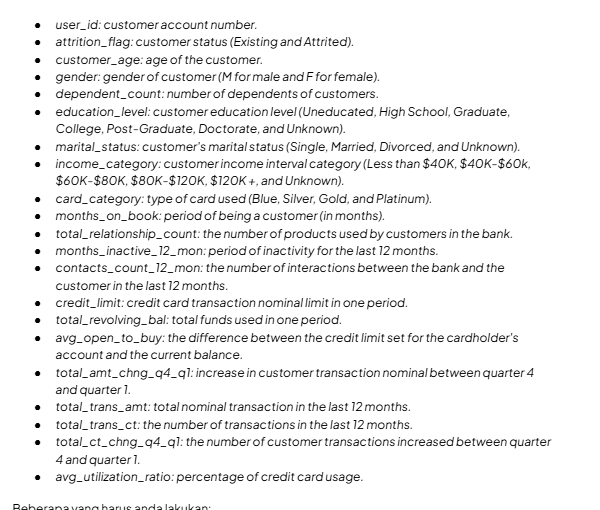

# Data Inspection

In [5]:
# check churn_data data structure and its types
churn_data.dtypes

,0
user_id,int64
attrition_flag,object
customer_age,int64
gender,object
dependent_count,int64
education_level,object
marital_status,object
income_category,object
card_category,object
months_on_book,int64


In [6]:
# check data dimension
churn_data.shape

(10127, 21)

## MIssing Value

In [7]:
# check null values inside dataset
churn_data.isna().sum()

,0
user_id,0
attrition_flag,0
customer_age,0
gender,0
dependent_count,0
education_level,0
marital_status,0
income_category,0
card_category,0
months_on_book,0


In [8]:
# check dimension and null values inside dataset
print("Dimension of data: {}".format(churn_data.shape))
print("Number of null values:")


Dimension of data: (10127, 21)
Number of null values:


In [9]:
# drop user_id column
churn_data = churn_data.drop(['user_id'], axis = 1)

In [10]:
#check feature column
churn_data['attrition_flag'].value_counts()

,count
attrition_flag,
Existing Customer,8500
Attrited Customer,1627


Existing Customer	= No Churn

Attrited Customer = churn

In [11]:
churn_data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


#Encoding Data

In [12]:
#encoding feature
churn_data['attrition_flag'] = churn_data['attrition_flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})

In [13]:
print(churn_data['income_category'].unique())

['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']


In [14]:
#percentage data Uknown
(churn_data['income_category'] == 'Unknown').mean() * 100

10.980547052434087

In [15]:
churn_data['income_category'].value_counts()

,count
income_category,
Less than $40K,3561
$40K - $60K,1790
$80K - $120K,1535
$60K - $80K,1402
Unknown,1112
$120K +,727


In [16]:
churn_data['education_level'].value_counts()

,count
education_level,
Graduate,3128
High School,2013
Unknown,1519
Uneducated,1487
College,1013
Post-Graduate,516
Doctorate,451


In [17]:
#percentage data Uknown
(churn_data['education_level'] == 'Unknown').mean() * 100

14.999506270366346

In [18]:
churn_data['marital_status'].value_counts()

,count
marital_status,
Married,4687
Single,3943
Unknown,749
Divorced,748


In [19]:
#percentage data Uknown
(churn_data['marital_status'] == 'Unknown').mean() * 100

7.3960699121161255

In [20]:
#unknown income range will be assumed by Edu.level by age  and mode data, because the percentage is not too small to ignore, not too large to delete
def fill_unknown_income(group):
    mode = group['education_level'].mode()
    if not mode.empty:
        fill_value = mode[0]
    else:
        fill_value = 'Graduate'
    group['education_level'] = group['education_level'].replace('Unknown', fill_value)
    return group

# Apply the function and update the 'income_category' column within the DataFrame
churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True) #Changed line

<ipython-input-20-57e07c74c241>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True) #Changed line


In [21]:
#unknown income range will be assumed by Cust. credit limit and mode data, because the percentage is not too small to ignore, not too large to delete
def fill_unknown_income(group):
    mode = group['income_category'].mode()
    if not mode.empty:
        fill_value = mode[0]
    else:
        fill_value = 'Less than $40K'
    group['income_category'] = group['income_category'].replace('Unknown', fill_value)
    return group

# Apply the function and update the 'income_category' column within the DataFrame
churn_data = churn_data.groupby('credit_limit').apply(fill_unknown_income).reset_index(drop=True) #Changed line

def fill_unknown_income(group):
    mode = group['income_category'].mode()
    if not mode.empty:
        fill_value = mode[0]
    else:
        fill_value = 'Less than $40K'
    group['income_category'] = group['income_category'].replace('Unknown', fill_value)
    return group

# Apply the function and update the 'income_category' column within the DataFrame
churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True)

<ipython-input-21-3b9229a414fd>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  churn_data = churn_data.groupby('credit_limit').apply(fill_unknown_income).reset_index(drop=True) #Changed line
<ipython-input-21-3b9229a414fd>:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True)


In [22]:
#unknown Marital Status willl be assumed by Cust. age and mode data, because the percentage is not too small to ignore, not too large to delete
def fill_unknown_income(group):
    mode = group['marital_status'].mode()
    if not mode.empty:
        fill_value = mode[0]
    else:
        fill_value = 'Married'
    group['marital_status'] = group['marital_status'].replace('Unknown', fill_value)
    return group

# Apply the function and update the 'income_category' column within the DataFrame
churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True) #Changed line

<ipython-input-22-41192d03967a>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  churn_data = churn_data.groupby('customer_age').apply(fill_unknown_income).reset_index(drop=True) #Changed line


In [23]:
churn_data['income_category'].unique()

array(['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K',
       '$120K +'], dtype=object)

In [24]:
#encoding other categorical data
churn_data['gender'] = churn_data['gender'].map({'M': 0, 'F': 1})
churn_data['marital_status'] = churn_data['marital_status'].map({'Married': 0, 'Single': 1, 'Divorced': 2})
churn_data['card_category'] = churn_data['card_category'].map({'Blue': 0, 'Silver': 1, 'Gold': 2, 'Platinum': 3})
churn_data['education_level'] = churn_data['education_level'].map({'Uneducated': 0, 'High School': 1, 'College': 2, 'Graduate': 3, 'Post-Graduate': 4, 'Doctorate': 5})
churn_data['income_category']= churn_data['income_category'].map({'Less than $40K': 0, '$40K - $60K': 1, '$60K - $80K': 2, '$80K - $120K': 3, '$120K +': 4})


In [25]:
churn_data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,0,26,0,0,2,1,0,0,36,4,1,3,1438.3,479,959.3,0.553,1786,37,0.370,0.333
1,0,26,1,1,3,1,1,0,20,6,3,3,1438.3,673,765.3,0.595,2167,48,0.412,0.468
2,0,26,0,0,3,1,0,0,19,4,1,2,1438.3,0,1438.3,0.472,2005,47,0.469,0.000
3,0,26,0,0,3,1,0,0,20,6,2,3,1438.3,495,943.3,1.062,2546,40,0.333,0.344
4,0,26,1,0,0,1,0,0,20,4,3,4,1438.3,0,1438.3,0.764,2731,39,0.500,0.000


In [26]:
churn_data.isna().sum()

,0
attrition_flag,0
customer_age,0
gender,0
dependent_count,0
education_level,0
marital_status,0
income_category,0
card_category,0
months_on_book,0
total_relationship_count,0


NO.1

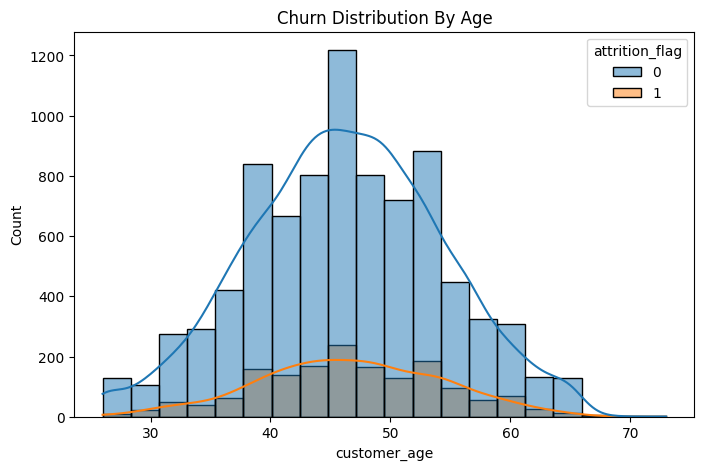

In [27]:
 #distribution Churn byAge
plt.figure(figsize=(8,5))
sns.histplot(data=churn_data, x='customer_age', hue='attrition_flag', bins=20, kde=True)
# Specify data source and map columns to x and hue
plt.title("Churn Distribution By Age")
plt.show()

we cna obsereve, churn distribution relatively lower then no-churn customer in every age group. churn rate have small increase at the age group 50, but also at theage grouo 40-55 shown the customer retain.

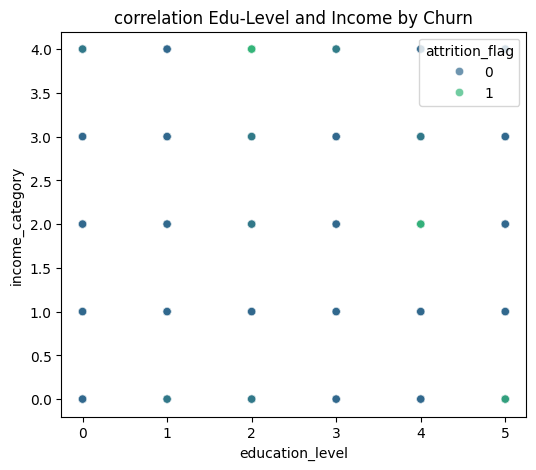

In [28]:
#b. churn correlation with education level and income
plt.figure(figsize=(6, 5))
sns.scatterplot(data=churn_data, x="education_level", y="income_category", hue="attrition_flag", alpha=0.7, palette="viridis")
plt.title("correlation Edu-Level and Income by Churn")
plt.show()


we can obsereve from the plot, churn customer almost have no correlaion with level Education and Income

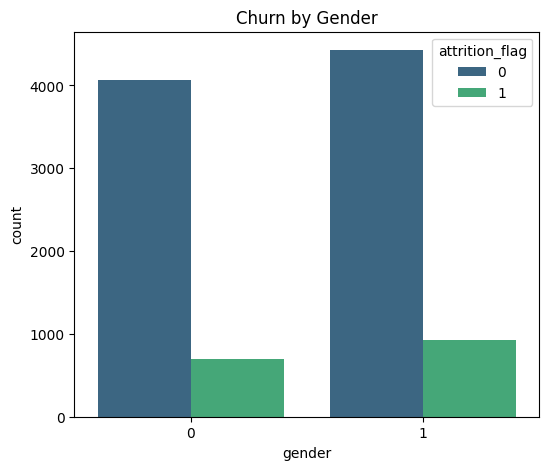

In [29]:
#C. Churn by gender
plt.figure(figsize=(6, 5))
sns.countplot(data=churn_data, x="gender", hue="attrition_flag", palette="viridis")
plt.title("Churn by Gender")
plt.show()

In [30]:
#churn number by gender
churn_gender= churn_data.groupby(['gender', 'attrition_flag']).size().unstack()
churn_gender


attrition_flag,0,1
gender,,
0,4072,697
1,4428,930


In [31]:
#churn dist by gender
churn_count = churn_data.groupby('gender')['attrition_flag'].value_counts(normalize=True).unstack() * 100
churn_count

attrition_flag,0,1
gender,,
0,85.384777,14.615223
1,82.642777,17.357223


* female customer is higher in number than the make customer,
* churn customer in female group is higher tahn te male group,


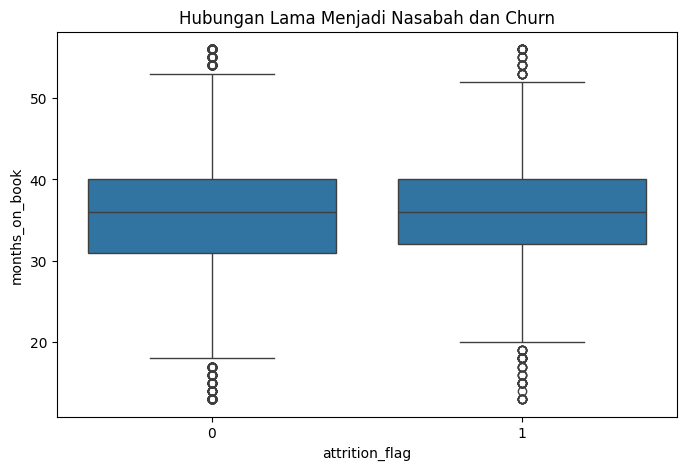

In [32]:
#d. the time being a customer
from scipy.stats import ttest_ind
churn_data
plt.figure(figsize=(8,5))
sns.boxplot(x='attrition_flag', y='months_on_book', data=churn_data)
plt.title("Hubungan Lama Menjadi Nasabah dan Churn")
plt.show()


* From box plot, Length of time as customer has no influence on loyalty, as we can see the chun and no churn cutomer have a similar plot

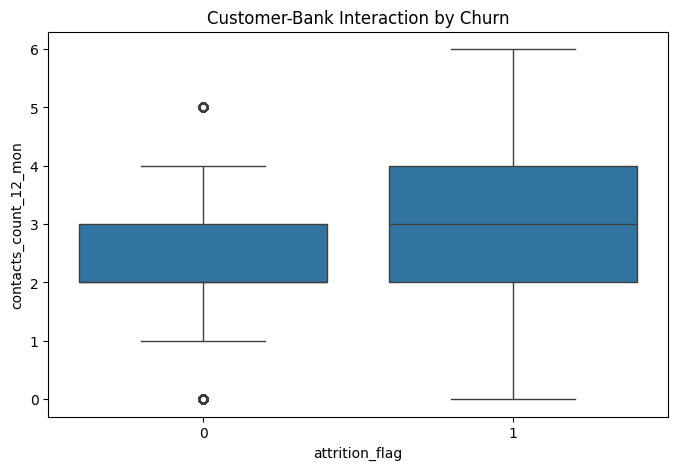

In [33]:
# d. Customer interaction with bank,
plt.figure(figsize=(8,5))
sns.boxplot(x='attrition_flag', y='contacts_count_12_mon', data=churn_data)
plt.title("Customer-Bank Interaction by Churn")
plt.show()

* The churn cusromer have higher median than the no-churn customer, also there's  churn customer have 0 interaction or highes ineteraction(6 times)
* no-churn customer more have consistent interaction, the distribution more narrom than the churn customer, and majority no-churn customer have 2-3 tomes interaction
* the outlier in the no-churn plotmean there's customer that not churn has 0 interaction or higher than thhe Majority no- churn customer (5 times)


No.2 Prediction Model

# Train-Test Split

In [34]:
# cretate predictor variables as X
X = churn_data.drop(['attrition_flag'],  axis = 1)
# create target data as y
y = churn_data['attrition_flag']

In [35]:
# split data to train and test data
# where 30% of churn_data are test data
# stratify data based on y varibales
# and freeze RNG with random_state = 1000
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    stratify = y,
    random_state=1000
)

In [36]:
# check train data dimension
X_train.shape

(7088, 19)

In [37]:
# check test data dimension
X_test.shape

(3039, 19)

In [38]:
# check train target counts
y_train.value_counts()

,count
attrition_flag,
0,5949
1,1139


In [39]:
# check test target counts
y_test.value_counts()

,count
attrition_flag,
0,2551
1,488


# EDA

In [40]:
#create correlation matrix
X_train.corr().style.background_gradient(cmap='coolwarm')



,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
customer_age,1.000000,0.018506,-0.118520,0.007385,-0.043483,0.028558,-0.011189,0.787589,-0.012963,0.047540,-0.026019,-0.001427,0.017001,-0.002952,-0.071840,-0.050273,-0.071689,-0.011720,0.006607
gender,0.018506,1.000000,-0.010505,-0.001713,0.014313,-0.758034,-0.082623,0.000152,-0.014151,0.003968,-0.037867,-0.421433,-0.037683,-0.417972,-0.018798,-0.023888,0.065745,0.005533,0.252922
dependent_count,-0.118520,-0.010505,1.000000,0.007104,-0.038290,0.076118,0.030551,-0.089381,-0.031415,-0.025559,-0.047590,0.076457,-0.006193,0.076998,-0.036358,0.018256,0.045960,0.009008,-0.034110
education_level,0.007385,-0.001713,0.007104,1.000000,-0.009106,0.001339,0.008729,0.004476,-0.001054,-0.007613,-0.001733,-0.003914,-0.012605,-0.002782,-0.009232,-0.014537,-0.015436,-0.019888,-0.006139
marital_status,-0.043483,0.014313,-0.038290,-0.009106,1.000000,-0.024917,0.038536,-0.029095,-0.004140,-0.004273,-0.005825,0.043099,-0.022642,0.045121,-0.039210,0.043061,0.106868,-0.014856,-0.028382
income_category,0.028558,-0.758034,0.076118,0.001339,-0.024917,1.000000,0.127191,0.028522,-0.001192,-0.009674,0.021415,0.551321,0.042573,0.547396,0.000974,0.018817,-0.051401,-0.015029,-0.290284
card_category,-0.011189,-0.082623,0.030551,0.008729,0.038536,0.127191,1.000000,-0.000279,-0.086525,-0.013589,0.001127,0.502517,0.032692,0.499487,0.016280,0.199184,0.138696,-0.001934,-0.200302
months_on_book,0.787589,0.000152,-0.089381,0.004476,-0.029095,0.028522,-0.000279,1.000000,-0.009069,0.061336,-0.016188,0.004350,0.007831,0.003646,-0.058683,-0.044322,-0.053646,-0.020047,-0.009223
total_relationship_count,-0.012963,-0.014151,-0.031415,-0.001054,-0.004140,-0.001192,-0.086525,-0.009069,1.000000,-0.004755,0.055516,-0.063537,0.027824,-0.066020,0.043118,-0.345729,-0.237177,0.030116,0.073256
months_inactive_12_mon,0.047540,0.003968,-0.025559,-0.007613,-0.004273,-0.009674,-0.013589,0.061336,-0.004755,1.000000,0.033880,-0.019465,-0.046079,-0.015328,-0.024882,-0.030888,-0.037936,-0.042780,-0.012135


credit_limit, avg_open_to_buy, total_trans_amt,	total_trans_ct, months_on_book, customer_age

In [41]:
#Drom colum redundant, high correlation
# drop certain column on train data
column_to_drop = ['credit_limit', 'avg_open_to_buy', 'total_trans_amt', 'total_trans_ct', 'months_on_book', 'customer_age']
X_train = X_train.drop(column_to_drop, axis = 1)

# drop certain column in test data
X_test = X_test.drop(column_to_drop, axis = 1)

# NO.2  Modeling

**Random Forest Model**
```python
sklearn.ensemble.RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)
```
For further explanation, check: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

In [42]:
# define random forest model
random_forest_clf = RandomForestClassifier(
    random_state = 1000,
    n_estimators=100
)
# fit model to training data
random_forest_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=1000)

**Multi-Layered Perceptron**
```python
sklearn.neural_network.MLPClassifier(hidden_layer_sizes=(100,), activation='relu', *, solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)
```
For further explanation, check: https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html

In [43]:
mlp_clf = MLPClassifier(
    random_state = 1000,
    hidden_layer_sizes = (8,),
    solver = 'sgd'
)

# fit model to training data
mlp_clf.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=(8,), random_state=1000, solver='sgd')

**XGBoost Classifier**
```python
xgboost.XGBClassifier(*, objective='binary:logistic', use_label_encoder=True, **kwargs)
```
For further explanation, check: https://xgboost.readthedocs.io/en/stable/python/python_api.html

In [44]:
# fit model no training data
xgb_clf = XGBClassifier(
    random_state = 1000
)

xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1000, ...)

In [45]:
xgb_clf

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1000, ...)

# Model Evaluation

In [46]:
# random forest prediction
rf_pred = random_forest_clf.predict(X_test)
rf_pred_proba = random_forest_clf.predict_proba(X_test)

# multi-layered perceptron prediction
mlp_pred = mlp_clf.predict(X_test)
mlp_pred_proba = mlp_clf.predict_proba(X_test)

# XGBoost prediction
xgb_pred = xgb_clf.predict(X_test)
xgb_pred_proba = xgb_clf.predict_proba(X_test)

**Classification Report**

In [47]:
# random forest prediction result
pd.DataFrame(metrics.classification_report(y_test, rf_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.914925,0.820513,0.905232,0.867719,0.899764
recall,0.978048,0.524590,0.905232,0.751319,0.905232
f1-score,0.945434,0.640000,0.905232,0.792717,0.896388
support,2551.000000,488.000000,0.905232,3039.000000,3039.000000


In [48]:
# multi-layered perceptron prediction result
pd.DataFrame(metrics.classification_report(y_test, mlp_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.870514,0.609137,0.85357,0.739825,0.828542
recall,0.969816,0.245902,0.85357,0.607859,0.853570
f1-score,0.917486,0.350365,0.85357,0.633925,0.826418
support,2551.000000,488.000000,0.85357,3039.000000,3039.000000


In [49]:
# XGBoost prediction result
pd.DataFrame(metrics.classification_report(y_test, xgb_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.924493,0.761273,0.904245,0.842883,0.898283
recall,0.964720,0.588115,0.904245,0.776417,0.904245
f1-score,0.944178,0.663584,0.904245,0.803881,0.899120
support,2551.000000,488.000000,0.904245,3039.000000,3039.000000


**Confusion Matrix**

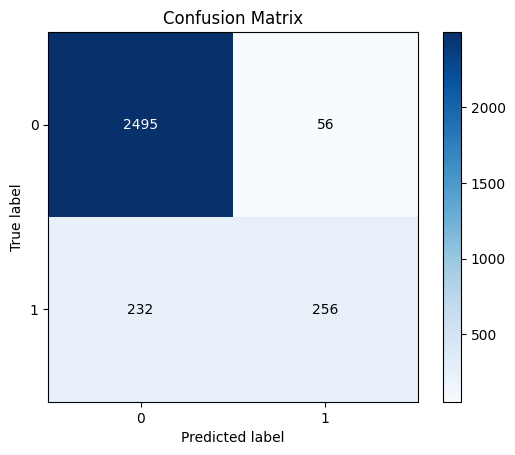

In [50]:
# random forest result
skplt.metrics.plot_confusion_matrix(y_test, rf_pred);

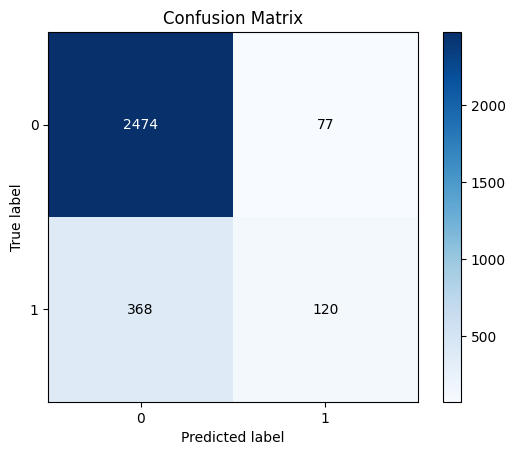

In [51]:
# multi-layered perceptron result
skplt.metrics.plot_confusion_matrix(y_test, mlp_pred);

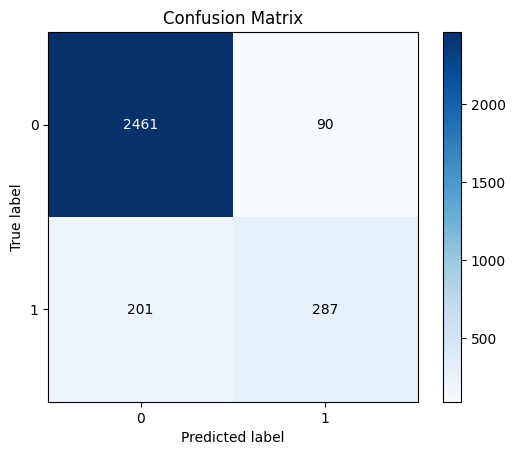

In [52]:
# xgboost result
skplt.metrics.plot_confusion_matrix(y_test, xgb_pred);

the best model from 3 model that we use, the Xgbost is th best model.
* from recall score for prediction churn cutomer i higher than the other 2, abouy 66,3%
* have the lowest FN(false negatif) and the highest TN (true positif) that predict the churn customer

**ROC-AUC**

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:95: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


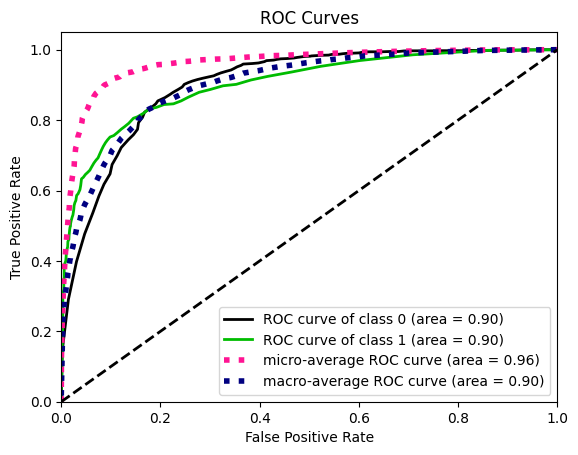

In [53]:
# random forest result
skplt.metrics.plot_roc_curve(y_test, rf_pred_proba);

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:95: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


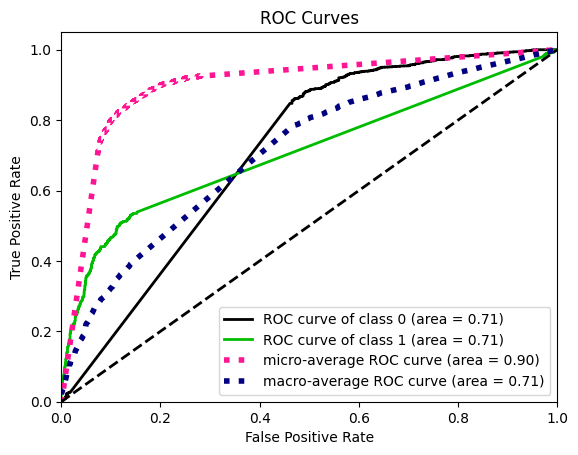

In [54]:
# multi-layered perceptron result
skplt.metrics.plot_roc_curve(y_test, mlp_pred_proba);

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:95: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


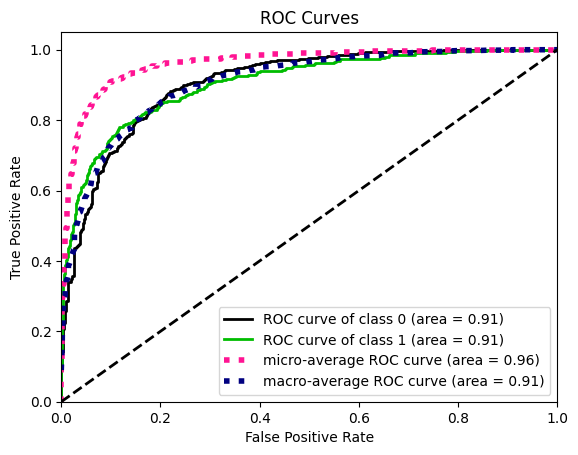

In [55]:
# xgboost result
skplt.metrics.plot_roc_curve(y_test, xgb_pred_proba);

# Model Agnostic Methods

In [62]:
# Inititate Explainer for all models

## initiate explainer for Random Forest model
churn_rf_exp = dx.Explainer(random_forest_clf, X_train, y_train, label = "RF Interpretation")
## initiate explainer for MLP model
churn_mlp_exp = dx.Explainer(mlp_clf, X_train, y_train, label = "MLP Interpretation")
## initiate explainer for XGBoost model
churn_xgb_exp = dx.Explainer(xgb_clf, X_train, y_train, label = "XGBoost Interpretation")

Preparation of a new explainer is initiated

  -> data              : 7088 rows 13 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 7088 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : RF Interpretation
  -> predict function  : <function yhat_proba_default at 0x7e5aae1ace00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.162, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.39, mean = -0.00133, max = 0.47
  -> model_info        : package sklearn

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 7088 rows 13 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a n

## Feature Importance

In [63]:
# visualizr permutation feature importance for Random Forest Model
churn_rf_exp.model_parts().plot()

In [64]:
# visualize permutation feature importance for MLP model
churn_mlp_exp.model_parts().plot()

In [65]:
# visualize permutation feature importance for XGBoost model
churn_xgb_exp.model_parts().plot()

## Partial Dependence Plot

In [66]:
# create partial dependence plot of Random Forest model
churn_rf_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/13 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.01 0.02 ... 0.98 0.99 1.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:   8%|▊         | 1/13 [00:00<00:01,  6.11it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:  15%|█▌        | 2/13 [00:00<00:01,  5.86it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: F

In [67]:
# create partial dependence plot of MLP model
churn_mlp_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/13 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.01 0.02 ... 0.98 0.99 1.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.

In [68]:
# create partial dependence plot of XGBoost model
churn_xgb_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/13 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.01 0.02 ... 0.98 0.99 1.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:   8%|▊         | 1/13 [00:00<00:01,  7.97it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:  15%|█▌        | 2/13 [00:00<00:01,  8.40it/s]/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: F

## Shapley Value and Shapley Additive Explanations

### Dataset Level Explanation

**Random Forest Model**

In [69]:
# create sample used for developing shapley
data_for_shapley = X_train.sample(n = 1000, random_state = 1000)

In [70]:
# create SHAP Tree Explainer for random forest model with first 1000 rows of train data
rf_shap_values = shap.TreeExplainer(random_forest_clf).shap_values(data_for_shapley)

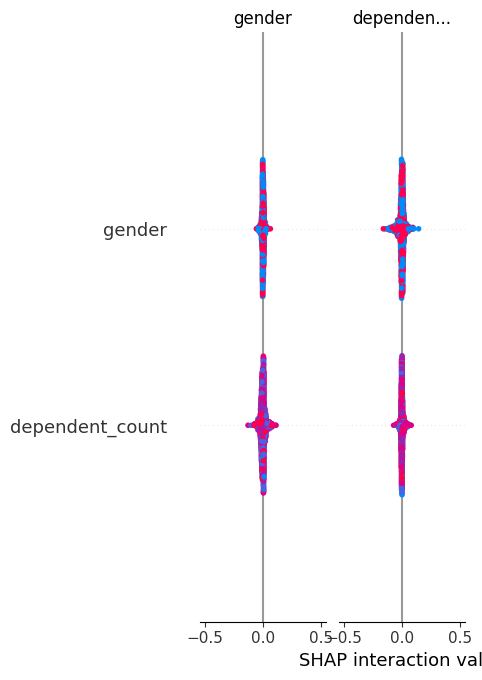

In [71]:
# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(rf_shap_values, X_train[1000:2000], plot_type='bar')

**XGBoost Model**

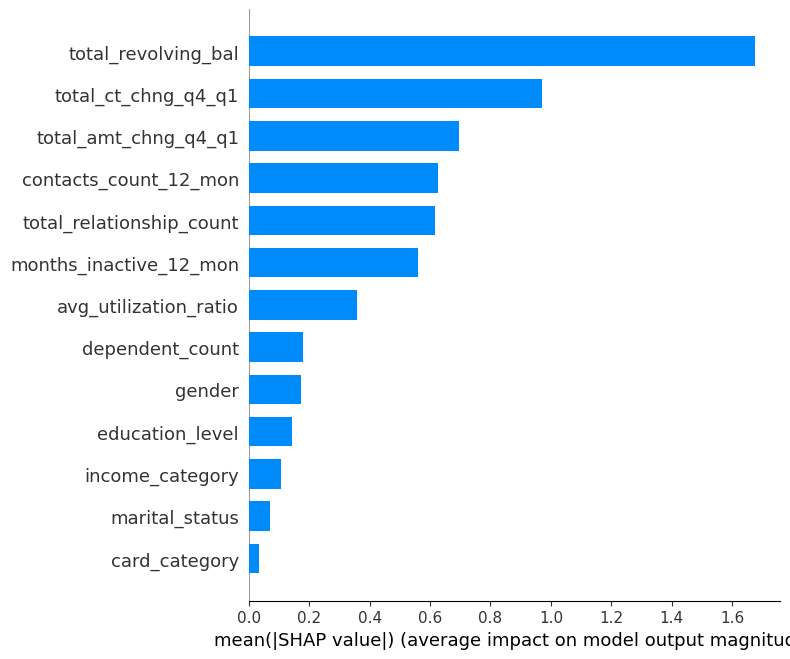

In [72]:
# create SHAP Tree Explainer for XGBoost model with| first 1000 rows of train data
xgb_shap_values = shap.TreeExplainer(xgb_clf).shap_values(X_train[:1000])

# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000], plot_type='bar')

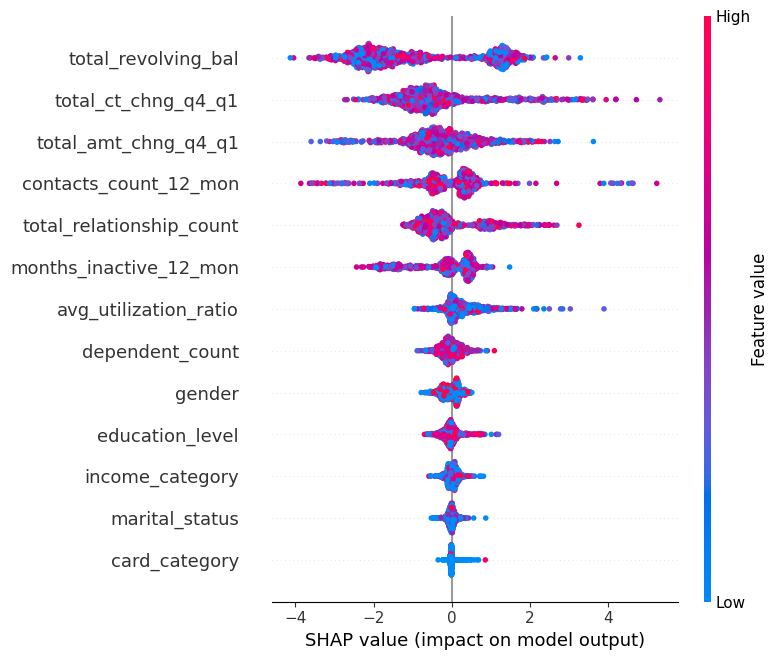

In [73]:
# create SHAP summary plot to visualize impact distribution of next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000])

**Multi-Layered Perceptron**

In [74]:
# create function for MLP model
f = lambda x: mlp_clf.predict_proba(x)[:,1]
# create median
med = X_train.median().values.reshape((1,X_train.shape[1]))

# create explainer for MLP model
mlp_explainer = shap.Explainer(f, med)
# implement SHAP method for MLP model
mlp_shap_values = mlp_explainer(X_train[:1000])

Streaming output truncated to the last 5000 lines.
X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature 

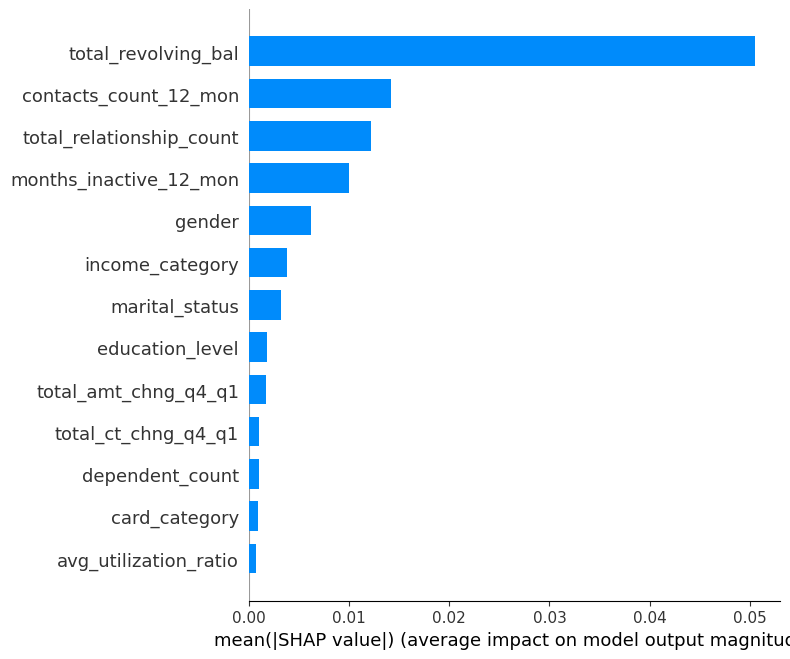

In [75]:
# create SHAP summary plot to visualize impact of next 1000 rows of train data
shap.summary_plot(mlp_shap_values, X_train[1001:2000], plot_type='bar')

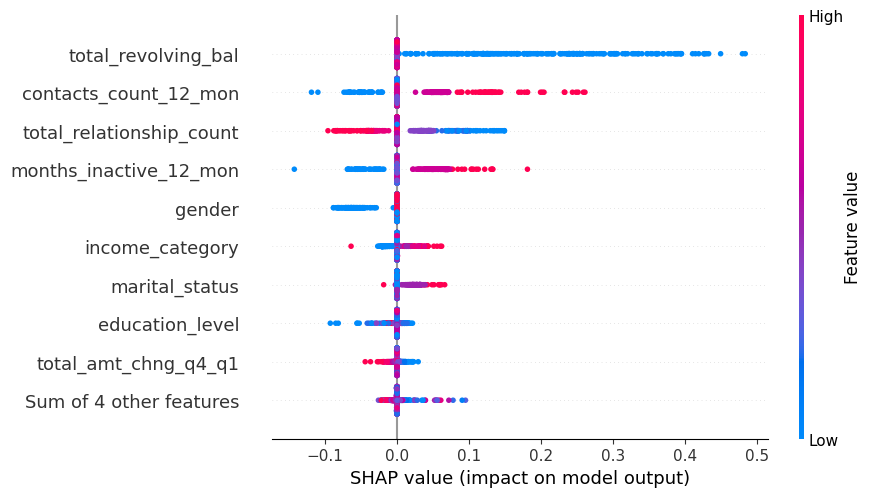

In [76]:
# create SHAP summary plot to visualize impact distribution
shap.plots.beeswarm(mlp_shap_values)

### Instance Level

In [77]:
# initiate javascript module
shap.initjs()

In [78]:
# check data for row 1
X_train.iloc[1,:]

,6587
gender,0.000
dependent_count,5.000
education_level,2.000
marital_status,0.000
income_category,2.000
card_category,2.000
total_relationship_count,1.000
months_inactive_12_mon,2.000
contacts_count_12_mon,2.000
total_revolving_bal,1064.000


In [79]:
# check target for row 1
y_train[1]

0

In [80]:
xgb_pred[1]

0

**XGBoost Model**

In [81]:
# create SHAP Tree Explainer for XGBoost model with all rows of train data
xgb_explainer = shap.TreeExplainer(xgb_clf)
# create shap values from xgb_explainer
xgb_shap_values = xgb_explainer.shap_values(X_train)

In [82]:
# initiate javascript module
shap.initjs()

# explain prediction for the first row of X_train
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values[1,:], X_train.iloc[1,:])

In [83]:
# initiate javascript module
shap.initjs()

# explain prediction for the first row of X_train
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values[:1000,:], X_train.iloc[:1000,:])

## Local Interpretable Model-Agnostic Explanation

In [84]:
# define Random Forest explainer with lime module
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names = X_train.columns.tolist(),
    class_names = ['churn', 'retained'],
    discretize_continuous = True,
    verbose = True
)

In [85]:
user_id_23976 = X_train.iloc[0]
user_id_23976

,9514
gender,1.000
dependent_count,2.000
education_level,0.000
marital_status,0.000
income_category,0.000
card_category,0.000
total_relationship_count,6.000
months_inactive_12_mon,3.000
contacts_count_12_mon,2.000
total_revolving_bal,0.000


In [86]:
rf_pred[0]

0

In [87]:
# explain Random Forest prediction for user_id: 23976
lime_explainer.explain_instance(user_id_23976, random_forest_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.19979239624191925
Prediction_local [0.53050095]
Right: 0.14


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not 

In [88]:
mlp_pred[0]

0

In [89]:
y_train.iloc[0]

0

In [90]:
# explain Random Forest prediction for user_id: 23976
lime_explainer.explain_instance(user_id_23976, mlp_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.1422021712087694
Prediction_local [0.24192898]
Right: 0.18417636123874248


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not 

In [91]:
xgb_pred[0]

0

In [92]:
# explain Random Forest prediction for user_id: 23976 (sometimes error)
lime_explainer.explain_instance(user_id_23976, xgb_clf.predict_proba).show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Intercept 0.1480871001621868
Prediction_local [0.30916082]
Right: 0.17043272


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



GitHib Link : https://github.com/TarfaGaida/Feature-Importance